# Product Recognition on Store Shelves
### Introduction:
Object detection techniques based on computer vision can be deployed in super market scenarios for the
creation of a system capable of recognizing products on store shelves. 
Given the image of a store shelf, such a system should be able identify the different products present 
therein and may be deployed, e.g. to help visually impaired costumers or to automate some common store
management tasks (e.g. detect low in stock or misplaced products).

### Overall Task:
Develop a computer vision system that, given a reference image for each product, is able to identify boxes 
of cereals of different brands from one picture of a store shelf. For each type of product displayed in the 
shelf the system should report:

1. Number of instances.
2. Dimension of each instance (width and height of the bounding box that enclose them in pixel).
3. Position in the image reference system of each instance (center of the bounding box that enclose 
them in pixel).

# Imported Libraries and Classes

In [1]:
# Imported Libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from os import listdir
import warnings
warnings.filterwarnings("ignore")

from utils.visualization import visualize_detections, print_detections
from utils.matchers import find_matcher_matrix
from utils.bbox_filtering import find_bboxes

# Images Path
scene_folder = './images/scenes/'
model_folder = './images/models/'

#reloads external modules when they are changed
%load_ext autoreload
%autoreload 2

# Model images overview

Reference images for each product that the system should be able to identify.

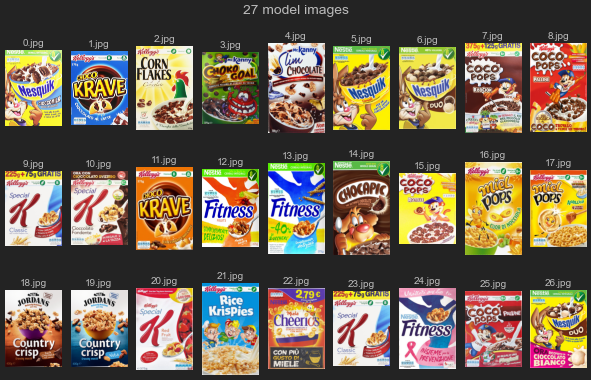

In [2]:
# Dictionary of models converted from BGR to RGB and sorted
models_props = [{'name': name, 'im': cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB)} for name in listdir(model_folder)]
models_props.sort(key = lambda x: int(x['name'].split('.')[0]))

# List of models
model_images = [x['im'] for x in models_props]

# Setting of values for printing models
w, h, dpi = 600, 400, 50
fig, axs = plt.subplots(nrows = 3, ncols = 9, dpi = dpi, figsize = (w/dpi, h/dpi))

# Print the list of models
for image_data, ax in zip(models_props, axs.ravel()):
    ax.imshow(image_data['im'])
    ax.set_title(image_data['name'])
    ax.set_axis_off()
fig.suptitle(f'{len(models_props)} model images', fontsize = 20)
fig.tight_layout(pad = 1)
#fig.savefig('./images/results/model_summary.png')
plt.show()

# Step A - Multiple Product Detection:

Develop an object detection system to identify single instance of products given: one reference image for 
each item and a scene image. The system should be able to correctly identify all the product in the shelves
image. One way to solve this task could be the use of local invariant feature as explained in lab session 5.

**It will have to be performed on the following materials:**

Test on scene image: {e1.png, e2.png, e3.png, e4.png, e5.png}

Use product images: {0.jpg, 1.jpg, 11.jpg, 19.jpg, 24.jpg, 26.jpg, 25.jpg}

## Read images

In [3]:
# Lists with the scenes and models of Step A
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]
scene_filenames = [f'e{i+1}.png' for i in range(5)]

#read images
im_model_list_original = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]
im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]

im_model_list = []

#resize model images
for im in im_model_list_original:
    s = 360
    aspect = im.shape[0]/im.shape[1]
    im_model_list.append(cv2.resize(im, (s, int(s*aspect))))

## Compute matches between each pair of scene and model image

In [4]:
#set the ransac reprojection threshold when computing the homography
homography_kw = dict(ransacReprojThreshold = 1.)

#compute matcher matrix
matcher_matrix = find_matcher_matrix(im_scene_list, im_model_list, K=15, multiple_instances=False, homography_kw=homography_kw)

## Visualize detections
Showing the detected bounding boxes. The correct detections are green, while the ones filtered by color are yellow.

We are detecting a single instance for each model. In the scene ``e3.jpg``, the models ``1`` and ``11`` are inverted in the detection. This is because RANSAC is using all the matching keypoints for calculating the homography, and it therefore excludes other matching keypoints belonging to another instance of the model in the scene. For SIFT, the models ``1`` and ``11`` look the same, because it is invariant to color.

This problem can be avoided using multiple instance detection.

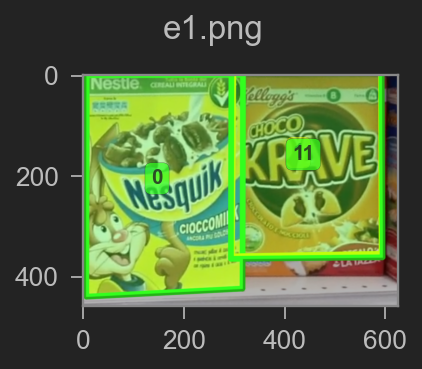

	Product 0 - 1 instance found:
		Instance 1: (position: (165, 215), width: 310px, height: 432px)
	Product 11 - 1 instance found:
		Instance 1: (position: (445, 167), width: 300px, height: 390px)


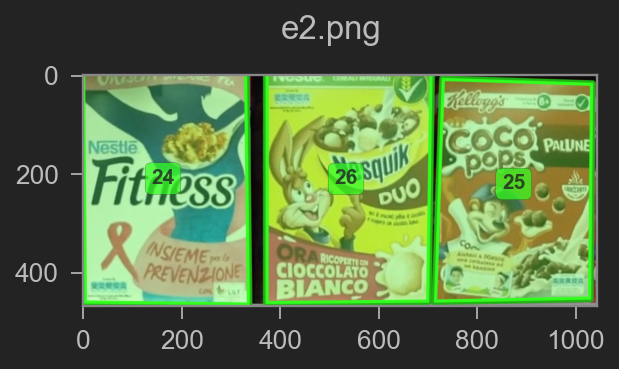

	Product 24 - 1 instance found:
		Instance 1: (position: (168, 220), width: 335px, height: 489px)
	Product 25 - 1 instance found:
		Instance 1: (position: (881, 231), width: 312px, height: 446px)
	Product 26 - 1 instance found:
		Instance 1: (position: (540, 221), width: 335px, height: 488px)


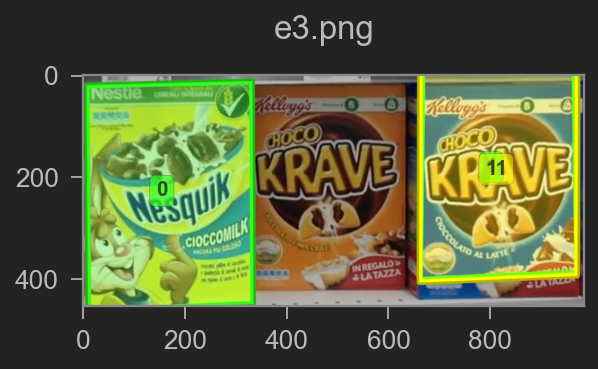

	Product 0 - 1 instance found:
		Instance 1: (position: (173, 237), width: 324px, height: 440px)
	Product 1 - 1 instance found:
		Instance 1: (position: (821, 191), width: 304px, height: 400px)


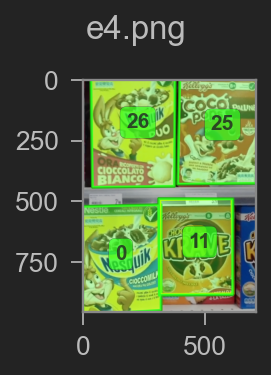

	Product 0 - 1 instance found:
		Instance 1: (position: (161, 740), width: 324px, height: 440px)
	Product 11 - 1 instance found:
		Instance 1: (position: (464, 690), width: 303px, height: 396px)
	Product 25 - 1 instance found:
		Instance 1: (position: (556, 207), width: 322px, height: 446px)
	Product 26 - 1 instance found:
		Instance 1: (position: (207, 198), width: 342px, height: 495px)


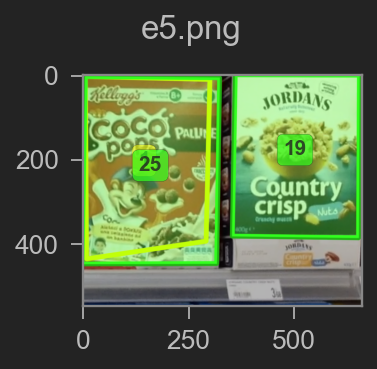

	Product 19 - 1 instance found:
		Instance 1: (position: (505, 189), width: 296px, height: 385px)
	Product 25 - 1 instance found:
		Instance 1: (position: (162, 226), width: 319px, height: 442px)


In [5]:
for i in range(len(im_scene_list)):
    scene_name = scene_filenames[i]
    bbox_props = find_bboxes(matcher_matrix[i], model_filenames, color_distance_threshold=15)
    fig, ax = visualize_detections(im_scene_list[i], bbox_props, plot_height=360, draw_invalid_bbox=(0,2))
    fig.suptitle(scene_name)
    fig.tight_layout(pad=0.5)
    #fig.savefig('images/results/found_' + scene_name)
    plt.show()
    
    print_detections(bbox_props)

### Multiple instance detection on ``e3.jpg``

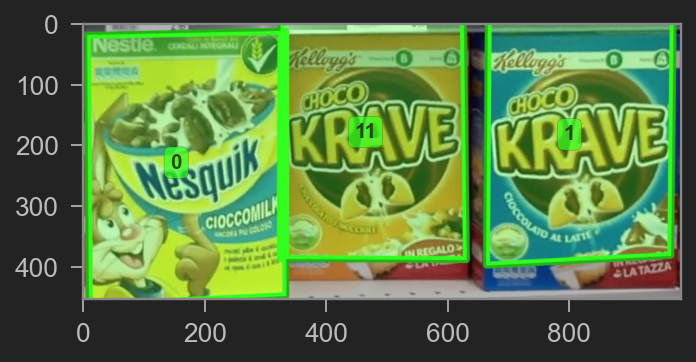

	Product 0 - 1 instance found:
		Instance 1: (position: (173, 237), width: 325px, height: 439px)
	Product 1 - 1 instance found:
		Instance 1: (position: (821, 191), width: 304px, height: 398px)
	Product 11 - 1 instance found:
		Instance 1: (position: (476, 187), width: 303px, height: 398px)


In [6]:
i = 2
matcher_matrix_e3 = find_matcher_matrix([im_scene_list[i]], im_model_list, K=15, multiple_instances=True, homography_kw=homography_kw)

scene_name = scene_filenames[i]
bbox_props = find_bboxes(matcher_matrix_e3[0], model_filenames, color_distance_threshold=15)
visualize_detections(im_scene_list[i], bbox_props, plot_height=360)
plt.show()

print_detections(bbox_props)

# Step B - Multiple Instance Detection:

In addition to what achieved at step A, the system should now be able to detect multiple instance of the 
same product. Purposely, students may deploy local invariant feature together with the GHT (Generalized 
Hough Transform). More precisely, rather than relying on the usual R-Table, the object model acquired at 
training time should now consist in vectors joining all the features extracted in the model image to their
barycenter; then, at run time all the image features matched with respect to the model would cast votes 
for the position of the barycenter by scaling appropriately the associated joining vectors (i.e. by the ratio of 
sizes between the matching features).

**It will have to be performed on the following materials:**

Test on scene image: {m1.png, m2.png, m3.png, m4.png, m5.png}

Use product images: {0.jpg, 1.jpg, 11.jpg, 19.jpg, 24.jpg, 26.jpg, 25.jpg}

## Read images

In [7]:
# Lists with the scenes and models of Step B
scene_filenames = [f'm{i+1}.png' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in (0, 1, 11, 19, 24, 25, 26)]

# Read images
im_scene_list = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list_original = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

#resize model images
for im in im_model_list_original:
    s = 360
    aspect = im.shape[0]/im.shape[1]
    im_model_list.append(cv2.resize(im, (s, int(s*aspect))))

## Compute matches between each pair of scene and model image

In [8]:
#set the ransac reprojection threshold when computing the homography
homography_kw = dict(ransacReprojThreshold = 1.)
peaks_kw = dict(height = 0.3, distance = 0.05)

#compute matcher matrix
matcher_matrix = find_matcher_matrix(im_scene_list, im_model_list, K=15, peaks_kw=peaks_kw, homography_kw=homography_kw)

## Visualize detections

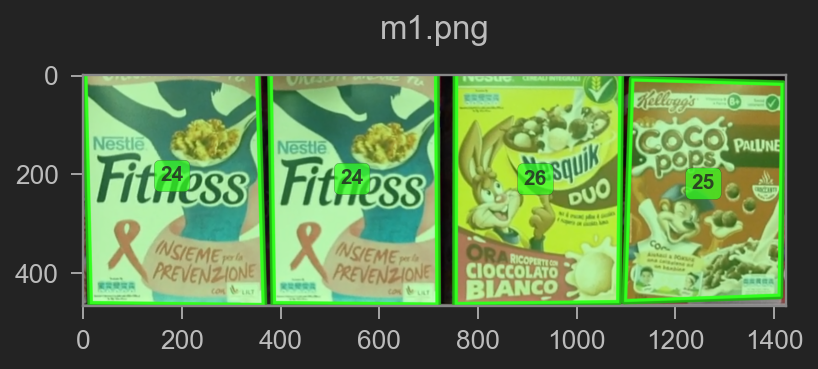

	Product 24 - 2 instance found:
		Instance 1: (position: (186, 214), width: 352px, height: 500px)
		Instance 2: (position: (551, 220), width: 336px, height: 491px)
	Product 25 - 1 instance found:
		Instance 1: (position: (1264, 230), width: 311px, height: 441px)
	Product 26 - 1 instance found:
		Instance 1: (position: (923, 221), width: 334px, height: 486px)


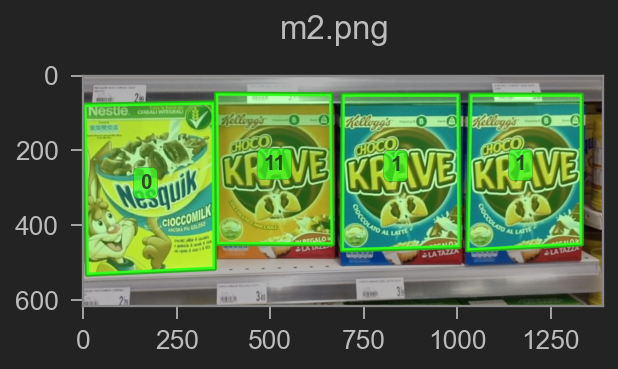

	Product 0 - 1 instance found:
		Instance 1: (position: (181, 302), width: 343px, height: 448px)
	Product 1 - 2 instance found:
		Instance 1: (position: (850, 256), width: 312px, height: 410px)
		Instance 2: (position: (1184, 253), width: 301px, height: 407px)
	Product 11 - 1 instance found:
		Instance 1: (position: (512, 251), width: 308px, height: 400px)


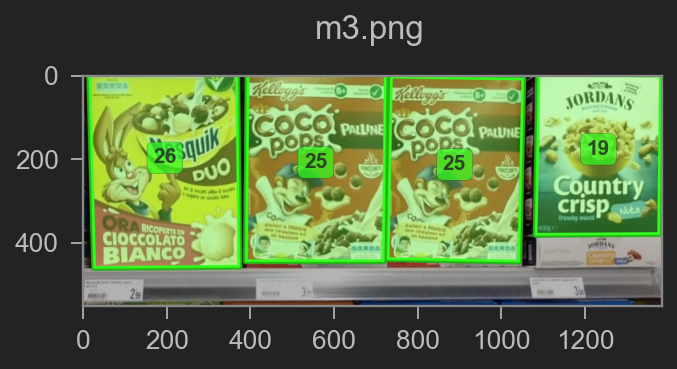

	Product 19 - 1 instance found:
		Instance 1: (position: (1235, 189), width: 296px, height: 383px)
	Product 25 - 2 instance found:
		Instance 1: (position: (559, 221), width: 333px, height: 452px)
		Instance 2: (position: (891, 225), width: 319px, height: 438px)
	Product 26 - 1 instance found:
		Instance 1: (position: (198, 210), width: 354px, height: 506px)


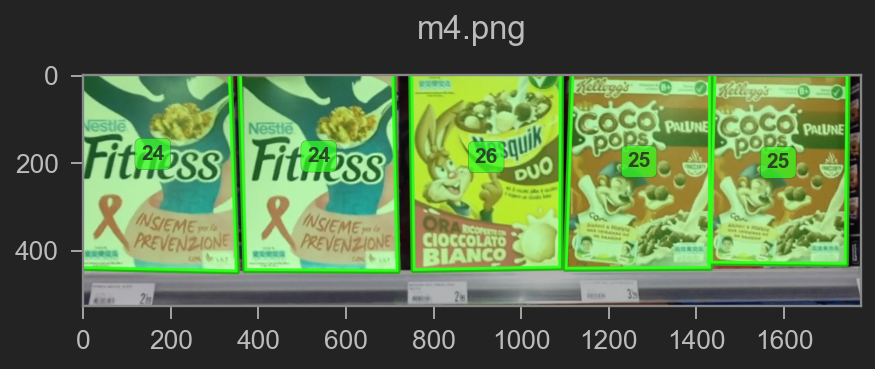

	Product 24 - 2 instance found:
		Instance 1: (position: (162, 192), width: 361px, height: 506px)
		Instance 2: (position: (541, 197), width: 352px, height: 502px)
	Product 25 - 2 instance found:
		Instance 1: (position: (1273, 209), width: 324px, height: 456px)
		Instance 2: (position: (1590, 211), width: 310px, height: 434px)
	Product 26 - 1 instance found:
		Instance 1: (position: (924, 198), width: 341px, height: 495px)


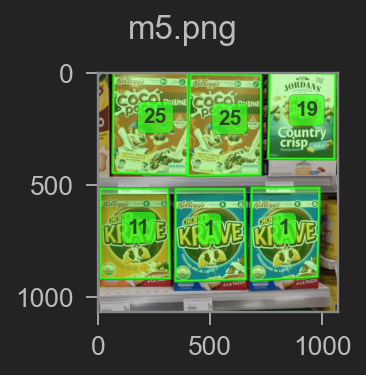

	Product 1 - 2 instance found:
		Instance 1: (position: (502, 718), width: 312px, height: 409px)
		Instance 2: (position: (837, 717), width: 302px, height: 407px)
	Product 11 - 1 instance found:
		Instance 1: (position: (164, 713), width: 308px, height: 402px)
	Product 19 - 1 instance found:
		Instance 1: (position: (910, 189), width: 295px, height: 386px)
	Product 25 - 2 instance found:
		Instance 1: (position: (235, 221), width: 335px, height: 456px)
		Instance 2: (position: (567, 228), width: 322px, height: 451px)


In [9]:
for i in range(len(im_scene_list)):
    scene_name = scene_filenames[i]
    bbox_props = find_bboxes(matcher_matrix[i], model_filenames, color_distance_threshold=5)
    fig, ax = visualize_detections(im_scene_list[i], bbox_props, plot_height=360)
    fig.suptitle(scene_name)
    fig.tight_layout(pad=0.5)
    #fig.savefig('images/results/found_' + scene_name)
    plt.show()
    
    print_detections(bbox_props)


# Step C: like B but with all models and tougher scenes

Try to detect as many products as possible in this challenging scenario: more than 40 different product instances for each picture, distractor elements (e.g. price tags…) and low resolution image. You can use whatever technique to achieve the maximum number of correct detection without mistake.

**It will have to be performed on the following materials:**

Test on scene image: {h1.png, h2.png, h3.png, h4.png, h5.png}

Use product images: {from 0.jpg to 26.jpg}

## Upsample scene images with neural network: Initialize model 

## Read images

In [10]:
# Lists with the scenes and models of Step B
scene_filenames = [f'h{i+1}.jpg' for i in range(5)]
model_filenames = [f'{i}.jpg' for i in range(27) if i!=23] # images 9 and 23 are the same

# Read images
im_scene_list_original = [cv2.cvtColor(cv2.imread(scene_folder + name), cv2.COLOR_BGR2RGB) for name in scene_filenames]
im_model_list_original = [cv2.cvtColor(cv2.imread(model_folder + name), cv2.COLOR_BGR2RGB) for name in model_filenames]

### Preprocess model images

The models are preprocessed by applying Gaussian filters of different widths:
 - 1 px
 - 3 px
 - 5 px

In addition, the unfiltered model images are resized to have a width of 360 px.

All these different versions of the models are used for the object detection.

In [11]:
im_model_list = []
model_labels = []

for im, label in zip(im_model_list_original, model_filenames):
    aspect = im.shape[0]/im.shape[1]
    #resize model images
    for s in (360,):
        im_resized = cv2.resize(im, (s, int(s*aspect)))
        im_model_list.append(im_resized)
        model_labels.append(label)

    #gaussian blur on original images
    for sigma in (1.5,3,5):
        k = int(np.ceil(3*sigma))
        im_model_list.append(cv2.GaussianBlur(im, (2*k+1, 2*k+1), sigma))
        model_labels.append(label)

### Preprocess scene images
The models were tested on a laptop equipped with an Intel Core i7 8750H CPU. The processing times for all 5 scene images were approximately as follows:
 - Model 1: 1 s
 - Model 2: 1 s
 - Model 3: 8 min
 - Model 4: 35 s

Model 2 performs better than 1, for the same computation time. Model 3 performs the best, and Model 4 has an intermediate performance. This is to be expected looking at the processing times.

In [15]:
### Initialization of Super Resolution 
train_dict = {1: ['fsrcnn', './weights/FSRCNN-small_x4.pb'],
              2: ['espcn', './weights/ESPCN_x4.pb'],
              3: ['edsr', './weights/EDSR_x4.pb'],
              4: ['lapsrn', './weights/LapSRN_x4.pb']}
nn_used = 4

sr = cv2.dnn_superres.DnnSuperResImpl_create()
sr.readModel(train_dict[nn_used][1])
sr.setModel(train_dict[nn_used][0], 4)

# upsample scene images
im_scene_list = [sr.upsample(im) for im in im_scene_list_original]

#save preprocessed images
#new_scene_folder = f"images/results/upscaled_scenes/upscaled_{nn_used}/"
#for im_scene, filename in zip(im_scene_list, scene_filenames):
#    cv2.imwrite(new_scene_folder + filename, cv2.cvtColor(im_scene, cv2.COLOR_RGB2BGR))

## Compute matches between each pair of scene and model image

In [16]:
#set the ransac reprojection threshold when computing the homography
homography_kw = dict(match_distance_threshold = 0.88, ransacReprojThreshold = 1.)
peaks_kw = dict(height = 0.3, distance = 0)

#compute matcher matrix
matcher_matrix = find_matcher_matrix(im_scene_list, im_model_list, K=15, peaks_kw=peaks_kw, homography_kw=homography_kw)

## Visualize detections

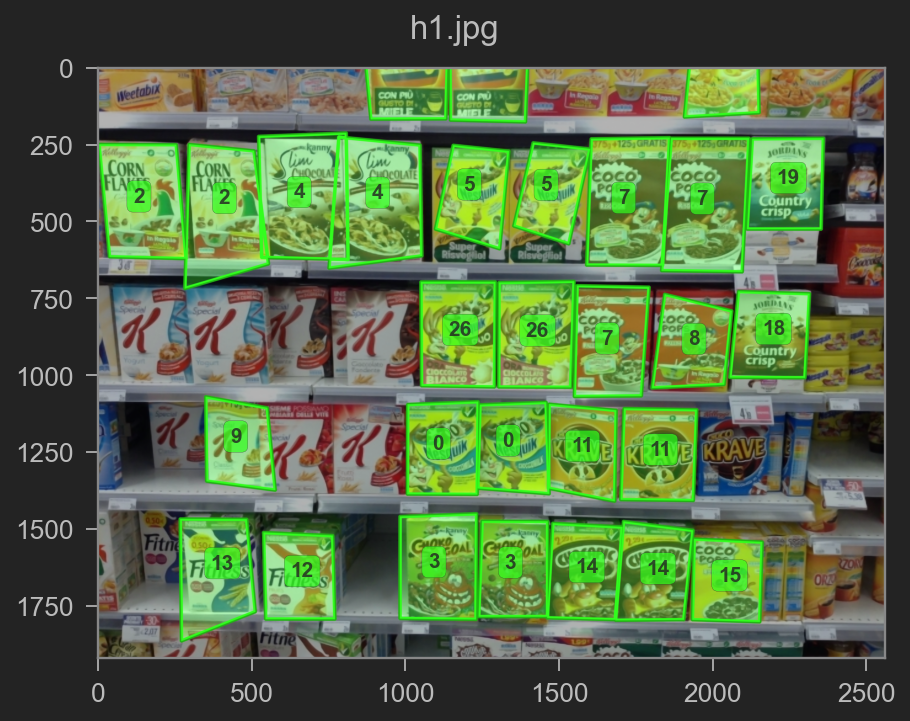

	Product 0 - 2 instance found:
		Instance 1: (position: (1119, 1241), width: 228px, height: 296px)
		Instance 2: (position: (1346, 1230), width: 224px, height: 284px)
	Product 11 - 2 instance found:
		Instance 1: (position: (1824, 1260), width: 236px, height: 296px)
		Instance 2: (position: (1570, 1249), width: 219px, height: 284px)
	Product 12 - 1 instance found:
		Instance 1: (position: (657, 1655), width: 225px, height: 276px)
	Product 13 - 1 instance found:
		Instance 1: (position: (397, 1629), width: 237px, height: 349px)
	Product 14 - 2 instance found:
		Instance 1: (position: (1814, 1647), width: 225px, height: 307px)
		Instance 2: (position: (1583, 1642), width: 223px, height: 305px)
	Product 15 - 1 instance found:
		Instance 1: (position: (2047, 1670), width: 221px, height: 261px)
	Product 16 - 1 instance found:
		Instance 1: (position: (2047, -8), width: 226px, height: 305px)
	Product 18 - 1 instance found:
		Instance 1: (position: (2190, 867), width: 237px, height: 277px)
	P

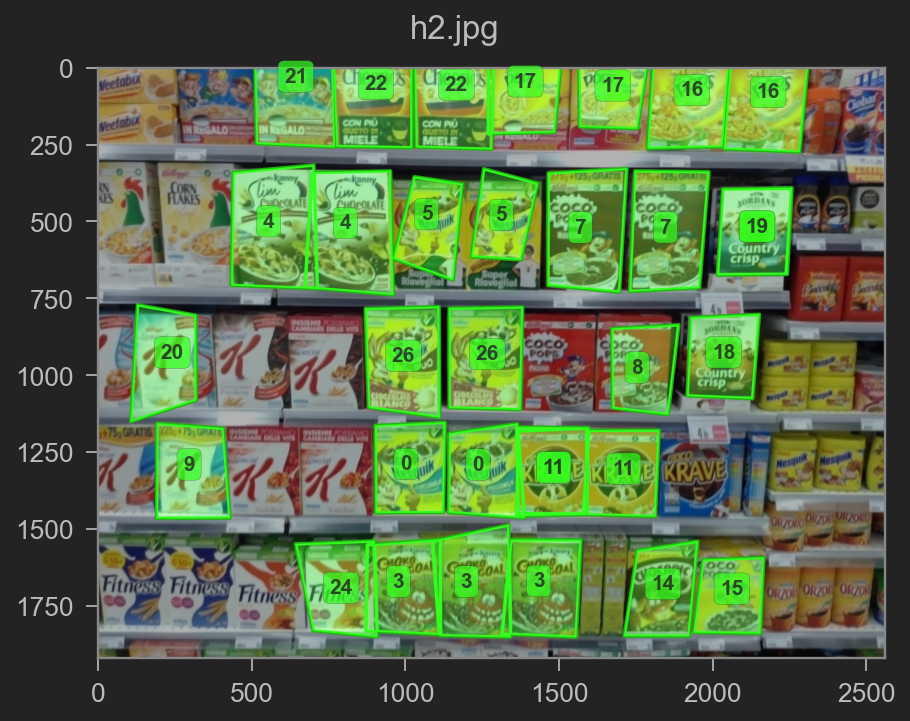

	Product 0 - 2 instance found:
		Instance 1: (position: (1013, 1307), width: 224px, height: 289px)
		Instance 2: (position: (1248, 1309), width: 236px, height: 283px)
	Product 11 - 3 instance found:
		Instance 1: (position: (1477, 1316), width: 225px, height: 279px)
		Instance 2: (position: (1704, 1322), width: 227px, height: 278px)
		Instance 3: (position: (1477, 1318), width: 224px, height: 281px)
	Product 14 - 1 instance found:
		Instance 1: (position: (1831, 1697), width: 205px, height: 296px)
	Product 15 - 1 instance found:
		Instance 1: (position: (2055, 1712), width: 207px, height: 243px)
	Product 16 - 2 instance found:
		Instance 1: (position: (2173, 97), width: 251px, height: 355px)
		Instance 2: (position: (1924, 91), width: 246px, height: 346px)
	Product 17 - 2 instance found:
		Instance 1: (position: (1383, 62), width: 232px, height: 329px)
		Instance 2: (position: (1667, 75), width: 212px, height: 277px)
	Product 18 - 1 instance found:
		Instance 1: (position: (2028, 943),

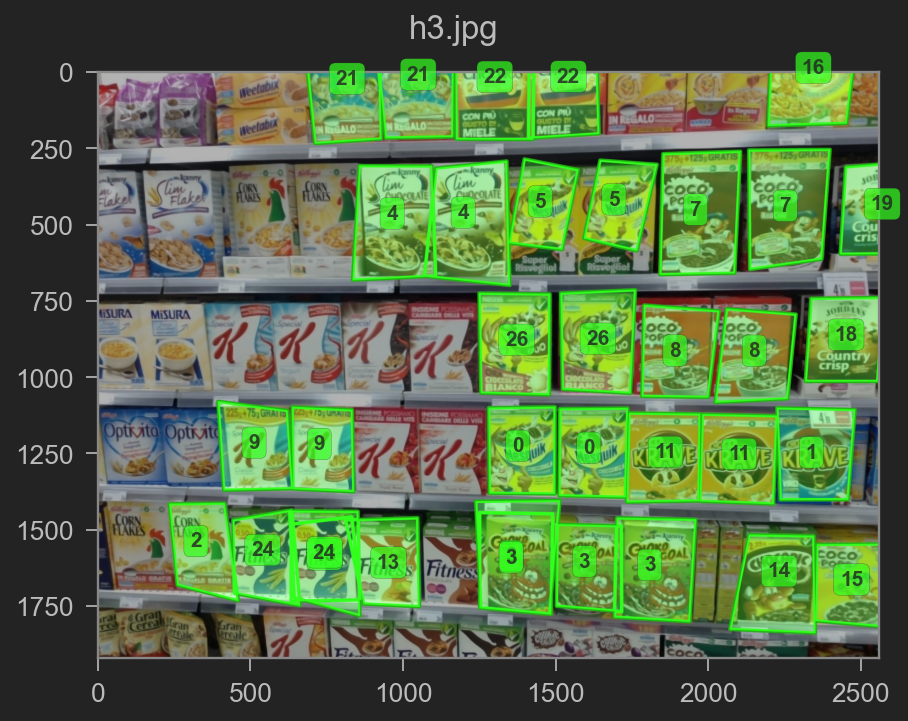

	Product 0 - 2 instance found:
		Instance 1: (position: (1620, 1249), width: 221px, height: 288px)
		Instance 2: (position: (1387, 1243), width: 216px, height: 282px)
	Product 1 - 1 instance found:
		Instance 1: (position: (2349, 1264), width: 239px, height: 298px)
	Product 11 - 2 instance found:
		Instance 1: (position: (1854, 1263), width: 235px, height: 289px)
		Instance 2: (position: (2095, 1270), width: 244px, height: 287px)
	Product 13 - 2 instance found:
		Instance 1: (position: (735, 1599), width: 224px, height: 314px)
		Instance 2: (position: (944, 1625), width: 210px, height: 286px)
	Product 14 - 1 instance found:
		Instance 1: (position: (2224, 1653), width: 246px, height: 317px)
	Product 15 - 1 instance found:
		Instance 1: (position: (2461, 1681), width: 231px, height: 261px)
	Product 16 - 1 instance found:
		Instance 1: (position: (2336, 4), width: 272px, height: 365px)
	Product 18 - 1 instance found:
		Instance 1: (position: (2443, 879), width: 238px, height: 274px)
	Pro

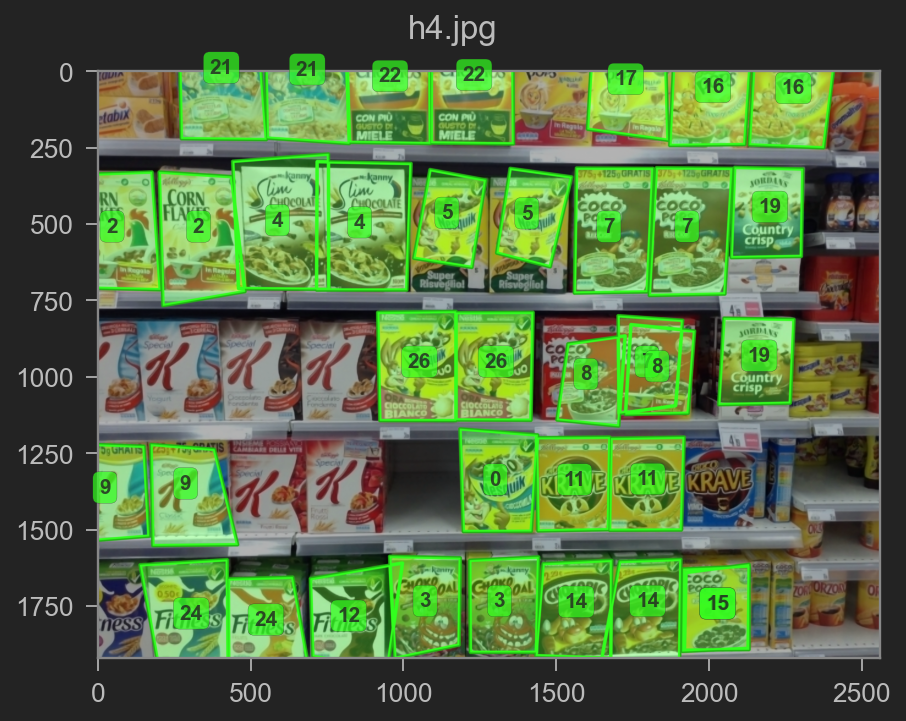

	Product 0 - 1 instance found:
		Instance 1: (position: (1311, 1354), width: 238px, height: 325px)
	Product 11 - 2 instance found:
		Instance 1: (position: (1554, 1354), width: 235px, height: 304px)
		Instance 2: (position: (1793, 1352), width: 237px, height: 302px)
	Product 12 - 1 instance found:
		Instance 1: (position: (813, 1800), width: 276px, height: 303px)
	Product 14 - 2 instance found:
		Instance 1: (position: (1791, 1751), width: 230px, height: 347px)
		Instance 2: (position: (1557, 1754), width: 235px, height: 311px)
	Product 15 - 2 instance found:
		Instance 1: (position: (2019, 1759), width: 209px, height: 267px)
		Instance 2: (position: (2020, 1759), width: 216px, height: 269px)
	Product 16 - 2 instance found:
		Instance 1: (position: (2268, 73), width: 256px, height: 367px)
		Instance 2: (position: (2005, 69), width: 248px, height: 351px)
	Product 17 - 1 instance found:
		Instance 1: (position: (1720, 43), width: 253px, height: 315px)
	Product 19 - 2 instance found:
		In

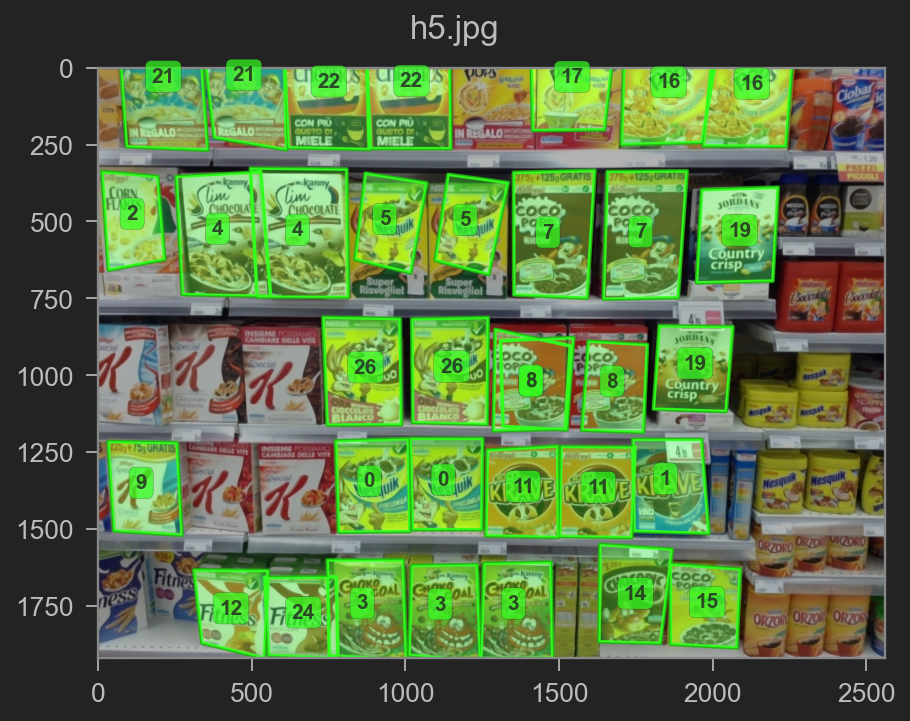

	Product 0 - 2 instance found:
		Instance 1: (position: (1134, 1358), width: 231px, height: 297px)
		Instance 2: (position: (894, 1362), width: 235px, height: 299px)
	Product 1 - 1 instance found:
		Instance 1: (position: (1857, 1354), width: 234px, height: 303px)
	Product 11 - 2 instance found:
		Instance 1: (position: (1377, 1380), width: 233px, height: 288px)
		Instance 2: (position: (1622, 1383), width: 238px, height: 294px)
	Product 12 - 1 instance found:
		Instance 1: (position: (425, 1776), width: 227px, height: 263px)
	Product 14 - 1 instance found:
		Instance 1: (position: (1741, 1727), width: 218px, height: 312px)
	Product 15 - 1 instance found:
		Instance 1: (position: (1974, 1756), width: 222px, height: 259px)
	Product 16 - 2 instance found:
		Instance 1: (position: (1849, 65), width: 291px, height: 412px)
		Instance 2: (position: (2120, 69), width: 265px, height: 371px)
	Product 17 - 1 instance found:
		Instance 1: (position: (1535, 47), width: 259px, height: 351px)
	Produ

In [19]:
for i in range(len(im_scene_list)):
    scene_name = scene_filenames[i]

    color_threshold = 15
    overlap_threshold = 0.5
    bbox_props = find_bboxes(matcher_matrix[i], model_labels, color_distance_threshold=color_threshold, min_match_threshold=4, bbox_overlap_threshold=overlap_threshold)

    fig, ax = visualize_detections(im_scene_list[i], bbox_props, plot_height=720)
    fig.suptitle(scene_name)
    fig.tight_layout(pad=0.5)
    #fig.savefig('images/results/found_' + scene_name)
    plt.show()
    
    print_detections(bbox_props)
